## 2 EDA

#  Contents<a id='Contents'></a>
* [1. Imports](#1._Imports)
* [2. Load The Data](#2._LoadData)
* [3. Step1: Exploring each Individual Variable](#3._Explore_individiual_variable)
    * [3.1. Measure Spread](#3.1_Measure_Spread)
    * [3.2. Distribution (Profiling)](#3.1_Distribution)
    * [3.3 Mode](#3.3_Mode)
        * [3.3.1 Categorical](#3.3.1_Categorical)
        * [3.3.2 Numerical](#3.3.2_Numerical)
    * [3.4 Time Series](#3.4_Time_Series)
* [4. Step 2: Exploring the relationship between each variable and the target](#4._Explore_relationship)
    * [4.1 Linearity Direction](#4.1_Linearity_direction)
    * [4.2 Bivariate visualizations](#4.2_Bivariate_visualization)
* [5. Step 3: Assessing interactions between variables](#5._Interaction_between_variables)
    * [5.1 Bivariate visualizations_for all combinations](#5.1_Bivariate_for_all)
    * [5.2 Correlation_matrices](#5.2_Correlation_matrices)
    * [5.3 summary statistics of variable x for different categories of y](#5.3_Compare_summary_statistic)
* [6. Step 4: Exploring data across many dimensions](#6._Explore_Data)
    * [6.1. Hypothesis Testing](#6.1_Hypothesis_test)
    * [6.2. Questions](#6.2_Questions)
* [7. Save Data](#7._Save)

## 1. Imports <a id='1._Imports'></a>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import scipy.stats as stats
from scipy.special import boxcox1p
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from pandas_profiling import ProfileReport

## 2.2 Load The Data<a id='2._LoadData'></a>

In [2]:
card_data = pd.read_csv('data/transaction_data_cleaned.csv', parse_dates=['transactionDateTime','currentExpDate','accountOpenDate','dateOfLastAddressChange'])


In [3]:
card_data.dtypes

accountNumber                        int64
creditLimit                        float64
availableMoney                     float64
transactionDateTime         datetime64[ns]
transactionAmount                  float64
merchantName                        object
acqCountry                          object
merchantCountryCode                 object
posEntryMode                         int64
posConditionCode                     int64
merchantCategoryCode                object
currentExpDate              datetime64[ns]
accountOpenDate             datetime64[ns]
dateOfLastAddressChange     datetime64[ns]
transactionType                     object
currentBalance                     float64
cardPresent                           bool
expirationDateKeyInMatch              bool
isFraud                               bool
CVVMatch                              bool
containsCom                           bool
lengthOfLast4Digits                  int64
creditLimitCategory                  int64
dtype: obje

In [4]:
card_data.head()

,accountNumber,creditLimit,availableMoney,transactionDateTime,transactionAmount,merchantName,acqCountry,merchantCountryCode,posEntryMode,posConditionCode,...,dateOfLastAddressChange,transactionType,currentBalance,cardPresent,expirationDateKeyInMatch,isFraud,CVVMatch,containsCom,lengthOfLast4Digits,creditLimitCategory
0,419104777,50000.0,50000.0,2016-01-01 00:01:02,44.09,Washington Post,US,US,9,1,...,2015-05-30,PURCHASE,0.0,False,False,False,True,False,4,5
1,958438658,20000.0,20000.0,2016-01-01 00:01:47,164.57,cheapfast.com,US,US,5,1,...,2013-07-20,PURCHASE,0.0,False,False,False,True,True,4,4
2,851126461,10000.0,10000.0,2016-01-01 00:02:04,122.83,discount.com,US,US,2,8,...,2014-10-18,PURCHASE,0.0,False,False,False,True,True,4,3
3,148963316,2500.0,2500.0,2016-01-01 00:02:19,0.00,Fast Repair,US,US,5,1,...,2013-12-12,ADDRESS_VERIFICATION,0.0,False,False,False,True,False,4,2
4,974901832,250.0,250.0,2016-01-01 00:03:47,24.56,staples.com,US,US,5,1,...,2012-05-29,PURCHASE,0.0,False,False,False,True,True,4,1


## 3 Step1: Exploring each individual variable<a id='3._Explore_individiual_variable'></a>

### 3.1 Measure Spread<a id='3.1_Measure_Spread'></a>

Lets check the spread of continuous variable:
- transactionAmount
- availableMoney
- currentBalance


### (a) IQR using boxplot

<AxesSubplot:>

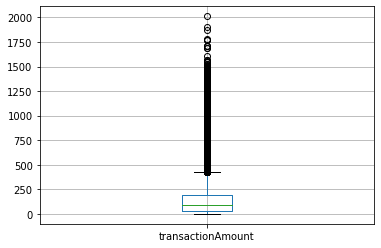

In [5]:
# 1. transaction amount 
card_data.boxplot(column = ['transactionAmount'],return_type = 'axes')


<AxesSubplot:>

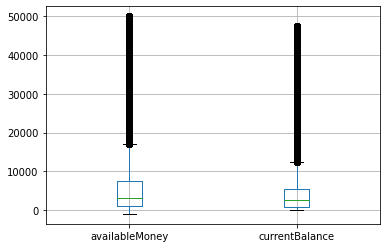

In [6]:
# 2. available money & current balance
card_data.boxplot(column = ['availableMoney','currentBalance'],return_type = 'axes')


There is a lot of outliers here.
We keep it for now to build our first ML model. We can drop outliers later and compare

### (b) Mean , Standard deviation

In [7]:
print('All data: ')
card_data[['currentBalance','availableMoney','transactionAmount']].describe()

All data: 


,currentBalance,availableMoney,transactionAmount
count,727282.000000,727282.000000,727282.000000
mean,4552.563597,6275.074788,136.964097
std,6520.221249,8875.817568,147.679849
min,0.000000,-1005.630000,0.000000
25%,703.842500,1085.725000,33.650000
50%,2477.565000,3208.205000,87.930000
75%,5341.390000,7500.000000,191.520000
max,47498.810000,50000.000000,2011.540000


Lets check the fraud entries

In [8]:
print('Fraud transactions summary: ')
card_data[card_data.isFraud == True][['currentBalance','availableMoney','transactionAmount']].describe()


Fraud transactions summary: 


,currentBalance,availableMoney,transactionAmount
count,11311.000000,11311.000000,11311.000000
mean,5030.909115,6178.245690,225.379355
std,7255.513001,8672.785235,189.691161
min,0.000000,-614.390000,0.000000
25%,852.200000,1088.285000,85.910000
50%,2833.980000,3142.570000,177.300000
75%,5840.900000,7662.350000,312.225000
max,47473.940000,50000.000000,1608.350000


In [9]:
print('Non-Fraud transactions summary: ')
card_data[card_data.isFraud == False][['currentBalance','availableMoney','transactionAmount']].describe()


Non-Fraud transactions summary: 


,currentBalance,availableMoney,transactionAmount
count,715971.000000,715971.000000,715971.000000
mean,4545.006635,6276.604506,135.567302
std,6507.661974,8878.985294,146.492407
min,0.000000,-1005.630000,0.000000
25%,701.435000,1085.670000,33.190000
50%,2471.690000,3209.340000,86.790000
75%,5333.800000,7500.000000,189.440000
max,47498.810000,50000.000000,2011.540000


There is a big difference in the mean transaction amount of fraud vs not fraud.
We can do Hypothesis testing



Do log transformation to prepare it for 2 Sample T-Test

In [10]:
# Check how many rows have transactionAmount as 0
card_data.loc[card_data.transactionAmount == 0]['transactionAmount'].count()

20643

In [11]:
card_data = card_data.replace(0.0,1)

In [12]:
# Confirm that there is no more 0 values
card_data.loc[card_data.transactionAmount == 0]['transactionAmount'].count()

0

In [13]:
card_data['transactionAmount'].value_counts()


1.00      20674
49.30       123
8.81        121
4.39        119
8.21        118
          ...  
434.30        1
671.70        1
996.80        1
629.43        1
573.31        1
Name: transactionAmount, Length: 64824, dtype: int64

All the 0 values have been replaced with 1

In [14]:
card_data['transactionAmountLog'] = np.log(card_data['transactionAmount'])

In [15]:
card_data['transactionAmountLog'].value_counts

<bound method IndexOpsMixin.value_counts of 0         3.786233
1         5.103336
2         4.810801
3         0.000000
4         3.201119
            ...   
727277    4.858571
727278    3.901366
727279    2.566487
727280    2.180417
727281    5.130313
Name: transactionAmountLog, Length: 727282, dtype: float64>

<AxesSubplot:>

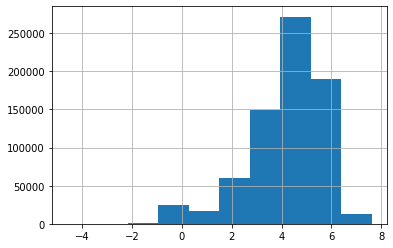

In [16]:
#  Its not exactly normal
card_data['transactionAmountLog'].hist()

Try boxcox 1p

In [17]:
card_data['transactionAmountBoxcox'] = boxcox1p(card_data['transactionAmount'],0.25)

(array([4.70690e+04, 7.72090e+04, 1.33471e+05, 1.65826e+05, 1.52042e+05,
        1.00026e+05, 4.09830e+04, 9.43800e+03, 1.16600e+03, 5.20000e+01]),
 array([9.96271726e-03, 2.28811084e+00, 4.56625897e+00, 6.84440710e+00,
        9.12255523e+00, 1.14007034e+01, 1.36788515e+01, 1.59569996e+01,
        1.82351477e+01, 2.05132959e+01, 2.27914440e+01]),
 <BarContainer object of 10 artists>)

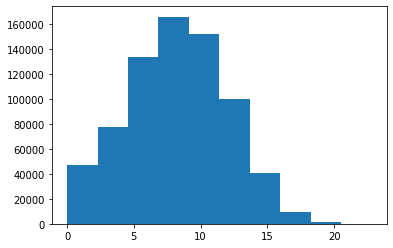

In [18]:
# This one looks closer to normal distribution. We use this instead 
plt.hist(card_data.transactionAmountBoxcox)

Remove transactionAmountLog column

In [19]:
card_data = card_data.drop(columns = 'transactionAmountLog')
card_data.columns

Index(['accountNumber', 'creditLimit', 'availableMoney', 'transactionDateTime',
       'transactionAmount', 'merchantName', 'acqCountry',
       'merchantCountryCode', 'posEntryMode', 'posConditionCode',
       'merchantCategoryCode', 'currentExpDate', 'accountOpenDate',
       'dateOfLastAddressChange', 'transactionType', 'currentBalance',
       'cardPresent', 'expirationDateKeyInMatch', 'isFraud', 'CVVMatch',
       'containsCom', 'lengthOfLast4Digits', 'creditLimitCategory',
       'transactionAmountBoxcox'],
      dtype='object')

Repeat boxcox1p transformation for currentBalance and availableMoney

In [20]:
card_data['currentBalanceBoxcox'] = boxcox1p(card_data['currentBalance'],0.25)
card_data['availableMoneyBoxcox'] = boxcox1p(card_data['availableMoney'],0.25)

(array([ 40370.,  50593.,  89173., 117547., 162448., 136995.,  72376.,
         38191.,   7971.,  11618.]),
 array([9.96271726e-03, 5.51414399e+00, 1.10183253e+01, 1.65225065e+01,
        2.20266878e+01, 2.75308691e+01, 3.30350503e+01, 3.85392316e+01,
        4.40434129e+01, 4.95475942e+01, 5.50517754e+01]),
 <BarContainer object of 10 artists>)

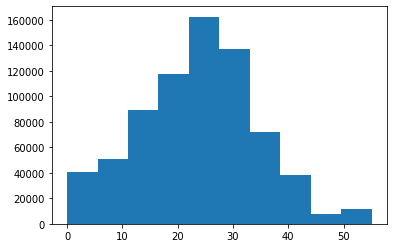

In [21]:
plt.hist(card_data.currentBalanceBoxcox)

(array([   275.,  20970.,  85117., 120033., 154092., 143256.,  97046.,
         72042.,   8592.,  23256.]),
 array([-2.10851678,  3.68375993,  9.47603664, 15.26831335, 21.06059006,
        26.85286677, 32.64514348, 38.43742019, 44.2296969 , 50.02197361,
        55.81425032]),
 <BarContainer object of 10 artists>)

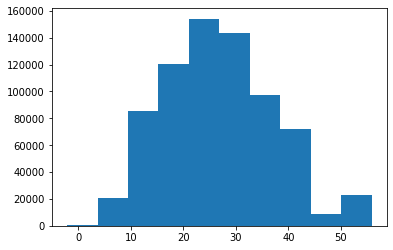

In [22]:
plt.hist(card_data.availableMoneyBoxcox)

### 3.2 Distribution for non categorical<a id='3.2_Distribution'></a>
#### Profiling

Let's redo pandas profiling with our new column and take note of numerical distribution

In [23]:
profile = ProfileReport(card_data, title = 'Profile Report')
profile

#### Numerical<a id='Numerical'></a>

Continuous:
- currentBalance
- availableMoney 
- transactionAmount

All of them have right skewed distribution



Discrete:
- lengthOfLast4Digits

86.2% have the correct 4 digits. the frequency is smaller as the number of digit decreases


### 3.3 Mode<a id='3.3_Mode'></a>
#### 3.3.1 Categorical<a id='3.3.1_Categorical'></a>

String:
- merchantname: AMC
- acqCountry: US
- transactionType: Purchase

Code: 
- posEntryMode: 5 (Integrated circuit card read)
- posConditionCode: 1 (Cardholder not present)
- merchantCategoryCode: online_retail
- creditLimitCategory: 2 ($ 2500 - $5000)

Binary:
- cardPresent: No
- expirationDateKeyInMatch: 99% False
- isFraud: 98.4% False
- CVVMatch: 99.1% True
- containsCom: 73% False


#### 3.3.2 Numerical<a id='3.3.2_Numerical'></a>

Continuous:
- currentBalance: USD 0 (4.2 percent)
- availableMoney: USD 250 (0.7 percent)
- transactionAmount: USD 0 (2.8 percent)


### 3.4 Time Series<a id='3.4_Time_Series'></a>

check if they are stationary. Observations from a non-stationary time series show seasonal effects, trends, and other structures that depend on the time index.

In [24]:
# extract time and date for transaction time
card_data['transactionTime'],card_data['transactionDate'] = card_data['transactionDateTime'].apply(lambda x:x.time()), card_data['transactionDateTime'].apply(lambda x:x.date())

# convert datatypes
card_data.loc[:,'transactionDate'] = pd.to_datetime(card_data['transactionDate'].copy())
card_data['transactionTime'] = pd.to_datetime(card_data['transactionTime'],format= '%H:%M:%S' ).dt.hour


<AxesSubplot:>

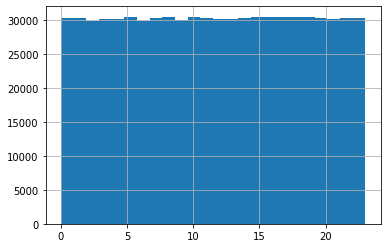

In [25]:
# histogram for 24 hour period.
# bin range every 2 hours
card_data['transactionTime'].hist(bins = 24)


time transaction is stationary. lets check months

In [26]:
card_data['transactionYear'] = card_data['transactionDate'].dt.year
card_data['transactionMonth'] = card_data['transactionDate'].dt.month

<AxesSubplot:xlabel='transactionMonth,transactionYear'>

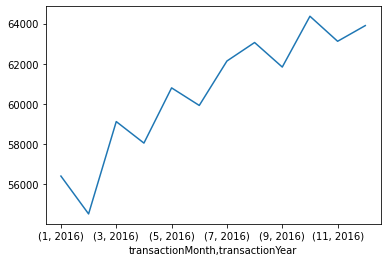

In [27]:
card_data.groupby(by=['transactionMonth', 'transactionYear']).size().plot()

There is an increasing trend in the number of transactions

In [28]:
card_data.transactionYear.value_counts()

2016    727282
Name: transactionYear, dtype: int64

there is only 1 year. so lets drop the year column

Get transaction day column

In [29]:
card_data = card_data.drop(columns = 'transactionYear')

In [30]:
card_data['dayOfTransaction'] = card_data['transactionDate'].dt.dayofweek

In [31]:
card_data['dayOfTransaction'].value_counts()

4    106158
5    103799
3    103684
1    103675
2    103673
0    103212
6    103081
Name: dayOfTransaction, dtype: int64

Most transaction takes place in day 4 which is Friday

## 4. Step 2: Exploring relationship with target<a id='4._Explore_relationship'></a>

### 4.1 Linearity Direction<a id='4.1_Linearity Direction'></a>

There is no linearity direction as target has binary values

### 4.2 Bivariate Visualization <a id='4.2_Bivariate_visualization'></a>
Calculate correlation

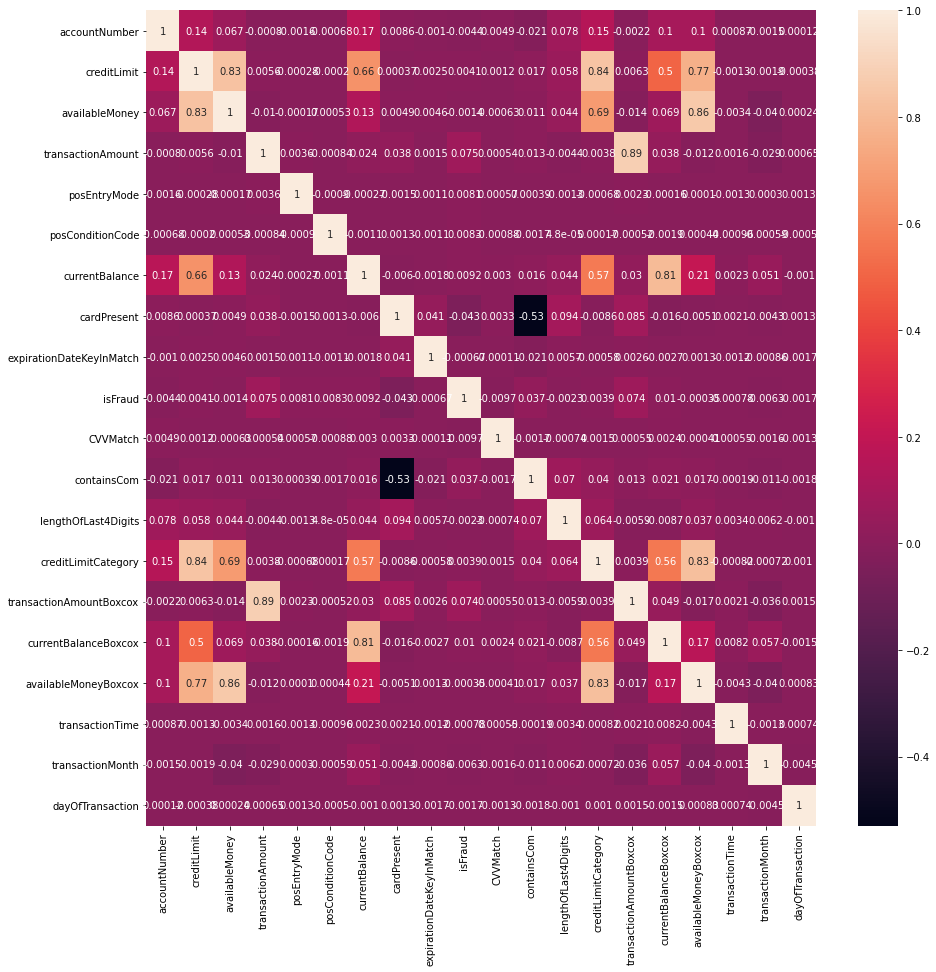

In [32]:
corrMatrix = card_data.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corrMatrix,annot = True)
plt.show()

Observation:
1. highest correlation for isFraud column is transaction amount and our new created column 'containsCom'
2. There is also strong negative correlation between isFraud and cardPresent. This could signify that there are more fraud when transactions that are made online, thus card is not present.


## 5. Step 3: Assessing interactions between variables<a id='5._Interaction_between_variables'></a>

 ### 5.1 Bivariate visualizations for all combinations<a id='5.1_Bivariate_for_all'></a>

Lets create seaborn boxplot per merchant name y-axis is transactionAMount

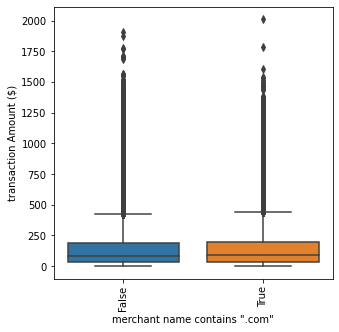

In [33]:
plt.subplots(figsize=(5, 5))
sns.boxplot(x='containsCom', y='transactionAmount', data=card_data)
plt.xticks(rotation='vertical')
plt.ylabel('transaction Amount ($)')
plt.xlabel('merchant name contains ".com"');

 ### 5.2 Correlation matrices<a id='5.2_Correlation_matrices'></a>
 Observation:
 1. There is the obvious high correlation between availableMoney and current balance. lets plot this again


<AxesSubplot:xlabel='creditLimit'>

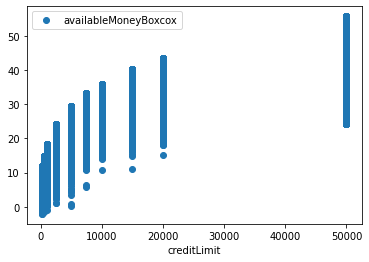

In [34]:
# Question 1. creditLimit to category instead of amount. Can I know remove availableMoney column ?
# Does this plot shows that one is not needed ?
card_data.plot(x='creditLimit', y='availableMoneyBoxcox',style='o')

<AxesSubplot:xlabel='creditLimitCategory'>

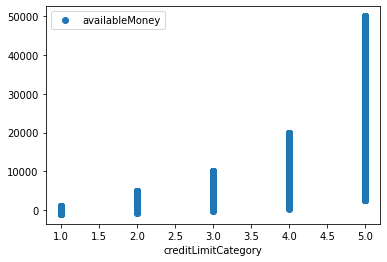

In [35]:
card_data.plot(x='creditLimitCategory', y='availableMoney',style='o')

 ### 5.3 summary statistics of variable x for different categories of y<a id='5.3_Compare_summary_statistic'></a>
 Question 8: How do I do this ?What does different categories of y means ?
 use groupby, take the mean of a continous column. based on categorcal column.

## 6. Step 7: Exploring data across many dimensions<a id='6._Explore_Data'></a>

### 6.1. Hypothesis Testing<a id='6.1_Hypothesis_test'></a>



First lets do box plot of fraduluent and non fraudulent transaction and compare the their transaction amount

In [36]:
# 1. extract fraud only
fraud_data = card_data[card_data['isFraud'] == True]

# 2. extract non fraud only
nonFraud_data = card_data[card_data['isFraud'] != True]

In [37]:
fraud_data['isFraud'].value_counts()

True    11311
Name: isFraud, dtype: int64

In [38]:
nonFraud_data['isFraud'].value_counts()

False    715971
Name: isFraud, dtype: int64

([<matplotlib.axis.XTick at 0x1210f8ac0>,
 [Text(1, 0, 'nonFraud'), Text(2, 0, 'Fraud')])

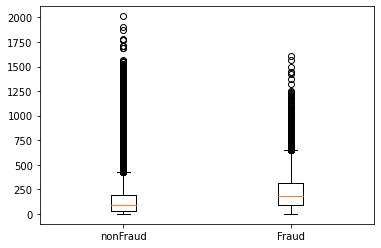

In [39]:
# box plot using plt
plt.boxplot([nonFraud_data['transactionAmount'],fraud_data['transactionAmount']])
plt.xticks([1,2],['nonFraud', 'Fraud'])

#### Two-Sample T Test


mean differences in transactions amount = $ \mu_{fraud} - \mu_{notFraud} = 225.38-135.57 = 51.43 $ dollars

$ H_0: $ Mean of transaction amount in fraud and non fraudulent are the same

$ H_1: $ Mean of transaction amount in fraud and non fraudulent are different

1. Calculate Standard deviation

In [40]:
#  variance of fraud
var_fraud = fraud_data['transactionAmountBoxcox'].var(ddof = 1)
var_nonFraud = nonFraud_data['transactionAmountBoxcox'].var(ddof = 1)

In [41]:
# standard deviation
s = np.sqrt((var_fraud +var_nonFraud)/2)
s

3.5843789891207773

2. Calculate t-statistics

In [42]:
t_stat, p_val = stats.ttest_ind(nonFraud_data['transactionAmountBoxcox'],fraud_data['transactionAmountBoxcox'], equal_var=False)
print('t statistics: ', t_stat)
print('p value: ', p_val)

t statistics:  -67.425092943638
p value:  0.0


P value is less that 0.05. We can reject the null hypothesis. There is a significant difference between the transaction amount of fraud and non fraudulent transaction

### 6.2. Questions<a id='6.2_Questions'></a>